# Install libraries

In [4]:
! pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 783.5/783.5 kB 40.3 MB/s eta 0:00:00


In [5]:
from ultralytics import YOLO
from IPython.display import display,Image

In [3]:
!pip install roboflow

Reason for being yanked: deprecated, use 4.8.0.76
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 34.8 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0.82
    Uninstalling opencv-python-headless-4.10.0.82:
      Successfully uninstalled opencv-python-headless-4.10.0.82
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall

# Install dataset

In [2]:
from roboflow import Roboflow

# Replace "YOUR_API_KEY" with your actual Roboflow API key
rf = Roboflow(api_key="eSYqLFVG6ijBKhESMdqs")

# Replace "YOUR_WORKSPACE_NAME" and "YOUR_PROJECT_NAME" with your actual workspace and project names
workspace = rf.workspace("tj1016-6mzid")
project = workspace.project("barcode-detection-sv5m7")

# Replace "VERSION_NUMBER" with the desired version number
version = project.version(2)

# Download the dataset
dataset = version.download("yolov8")

ModuleNotFoundError: No module named 'roboflow'

In [5]:
import os
# Define the data.yaml content
data_yaml_content = """
names:
- barcode
- datamatrix
- datamatrixcode
- qrcode
nc: 4
roboflow:
  license: CC BY 4.0
  project: barcode-detection-sv5m7
  url: https://universe.roboflow.com/tj1016-6mzid/barcode-detection-sv5m7/dataset/2
  version: 2
  workspace: tj1016-6mzid
test: /kaggle/working/Barcode-Detection--2/test
train: /kaggle/working/Barcode-Detection--2/train
val: /kaggle/working/Barcode-Detection--2/valid
"""
base_dir='/kaggle/working/Barcode-Detection--2'
# Write the data.yaml file
data_yaml_path = os.path.join(base_dir, 'data.yaml')
with open(data_yaml_path, 'w') as file:
    file.write(data_yaml_content.strip())

print(f"Data.yaml content written to {data_yaml_path}:\n{data_yaml_content}")


Data.yaml content written to /kaggle/working/Barcode-Detection--2/data.yaml:

names:
- barcode
- datamatrix
- datamatrixcode
- qrcode
nc: 4
roboflow:
  license: CC BY 4.0
  project: barcode-detection-sv5m7
  url: https://universe.roboflow.com/tj1016-6mzid/barcode-detection-sv5m7/dataset/2
  version: 2
  workspace: tj1016-6mzid
test: /kaggle/working/Barcode-Detection--2/test
train: /kaggle/working/Barcode-Detection--2/train
val: /kaggle/working/Barcode-Detection--2/valid



In [6]:
import os
os.environ['WANDB_MODE'] = 'disabled'

# Train the model

In [8]:
### Train the YOLOv8 model
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=50 imgsz=800 plots=True

Ultralytics YOLOv8.2.35 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/working/Barcode-Detection--2/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=

# Load the model

In [9]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8n.pt")  # Load an official model
model = YOLO("/kaggle/input/modelw/best.pt")  # Load a custom trained model

# Evaluation on val data

In [25]:
# Assuming you have a results object from validation
results = model.val()  # This is a hypothetical function call for validation, adjust according to your setup

# Accessing metrics from the validation results
map50 = results.metrics.mAP50  # Accessing mAP at 50 IoU
precision = results.metrics.precision  # Precision
recall = results.metrics.recall  # Recall

# Print the results
print("Validation Results:")
print(f"mAP50: {map50:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")


Ultralytics YOLOv8.2.35 🚀 Python-3.10.13 torch-2.1.2 CPU (Intel Xeon 2.00GHz)


val: Scanning /kaggle/working/Barcode-Detection--2/valid/labels.cache... 178 images, 0 backgrounds, 0 corrupt: 100%|██████████| 178/178 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [05:56<00:00, 29.68s/it]


                   all        178        472      0.983      0.988      0.992      0.815
               barcode        119        413       0.96      0.983      0.987      0.856
            datamatrix          2          2          1      0.997      0.995      0.895
                qrcode         57         57      0.987      0.982      0.995      0.694
Speed: 11.4ms preprocess, 1979.5ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detect/val2


AttributeError: 'DetMetrics' object has no attribute 'metrics'. See valid attributes below.

    This class is a utility class for computing detection metrics such as precision, recall, and mean average precision
    (mAP) of an object detection model.

    Args:
        save_dir (Path): A path to the directory where the output plots will be saved. Defaults to current directory.
        plot (bool): A flag that indicates whether to plot precision-recall curves for each class. Defaults to False.
        on_plot (func): An optional callback to pass plots path and data when they are rendered. Defaults to None.
        names (tuple of str): A tuple of strings that represents the names of the classes. Defaults to an empty tuple.

    Attributes:
        save_dir (Path): A path to the directory where the output plots will be saved.
        plot (bool): A flag that indicates whether to plot the precision-recall curves for each class.
        on_plot (func): An optional callback to pass plots path and data when they are rendered.
        names (tuple of str): A tuple of strings that represents the names of the classes.
        box (Metric): An instance of the Metric class for storing the results of the detection metrics.
        speed (dict): A dictionary for storing the execution time of different parts of the detection process.

    Methods:
        process(tp, conf, pred_cls, target_cls): Updates the metric results with the latest batch of predictions.
        keys: Returns a list of keys for accessing the computed detection metrics.
        mean_results: Returns a list of mean values for the computed detection metrics.
        class_result(i): Returns a list of values for the computed detection metrics for a specific class.
        maps: Returns a dictionary of mean average precision (mAP) values for different IoU thresholds.
        fitness: Computes the fitness score based on the computed detection metrics.
        ap_class_index: Returns a list of class indices sorted by their average precision (AP) values.
        results_dict: Returns a dictionary that maps detection metric keys to their computed values.
        curves: TODO
        curves_results: TODO
    

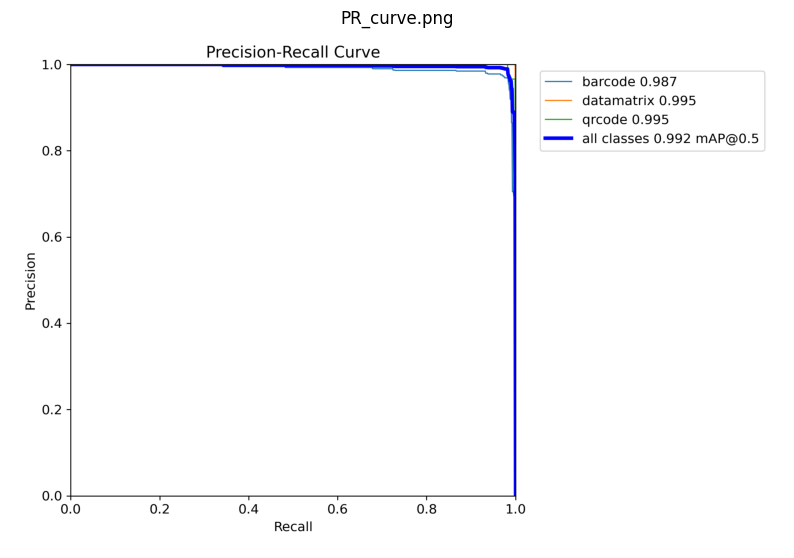

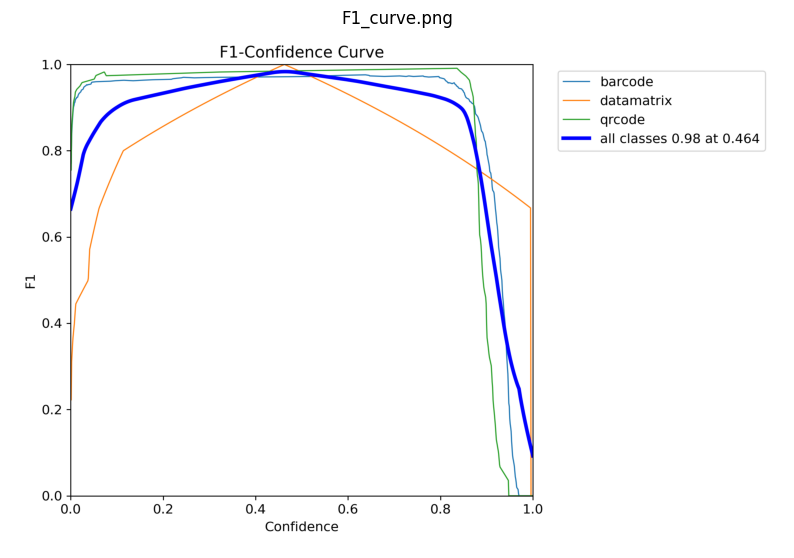

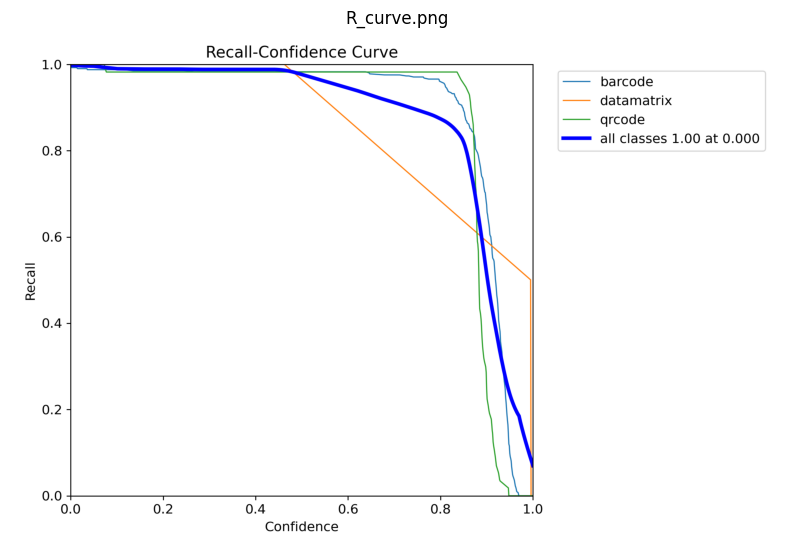

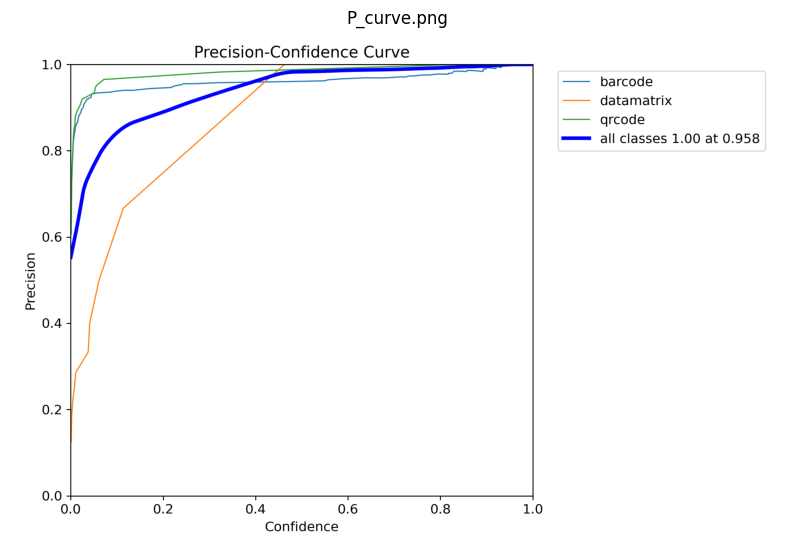

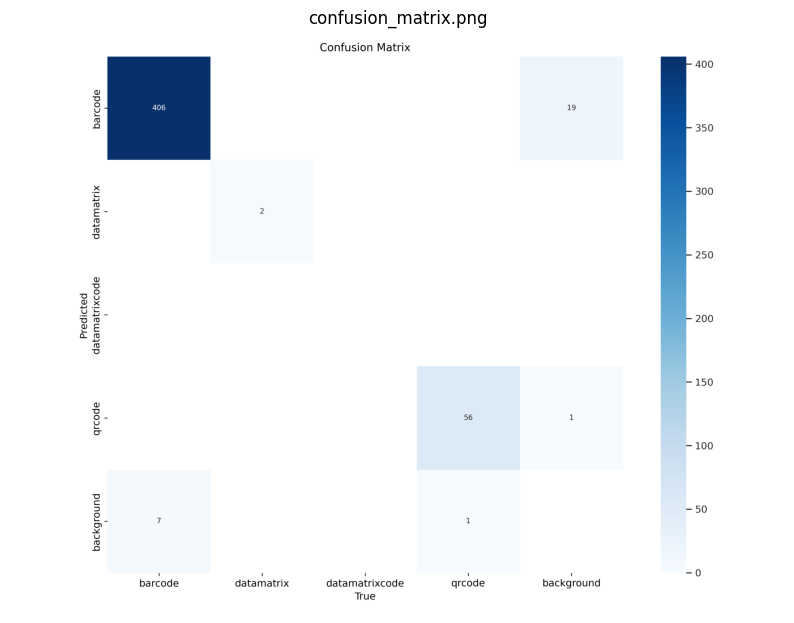

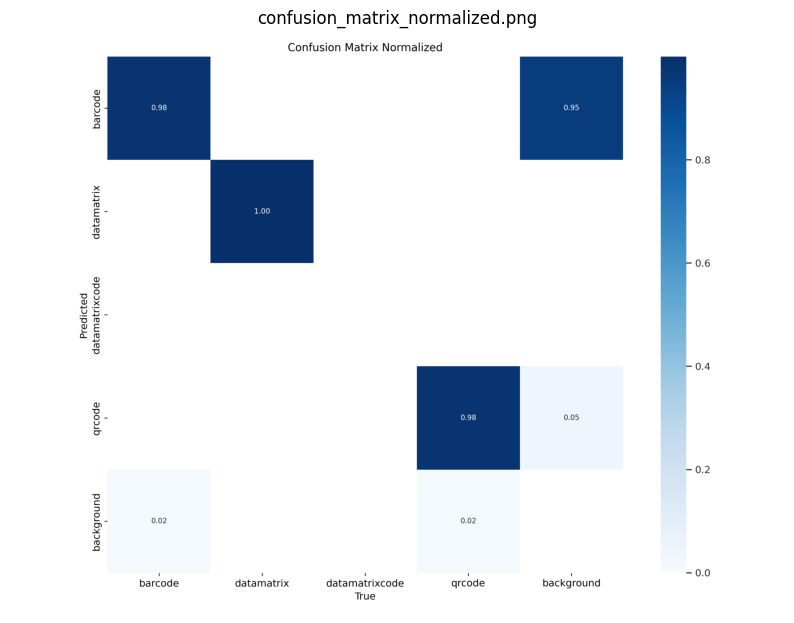

In [26]:
import cv2
import matplotlib.pyplot as plt
import os

# Directory containing the validation results
results_dir = '/kaggle/working/runs/detect/val2'

# List of files to visualize
files_to_visualize = [
    'PR_curve.png', 'F1_curve.png', 'R_curve.png', 'P_curve.png',
    'confusion_matrix.png', 'confusion_matrix_normalized.png'
]

# Load and display each file
for filename in files_to_visualize:
    file_path = os.path.join(results_dir, filename)
    if os.path.exists(file_path):
        # Load the image using OpenCV
        image = cv2.imread(file_path, cv2.IMREAD_COLOR)
        # Convert from BGR to RGB format
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display the image using Matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.title(filename)
        plt.axis('off')
        plt.show()
    else:
        print(f"File not found: {file_path}")


# Results Vizualisation

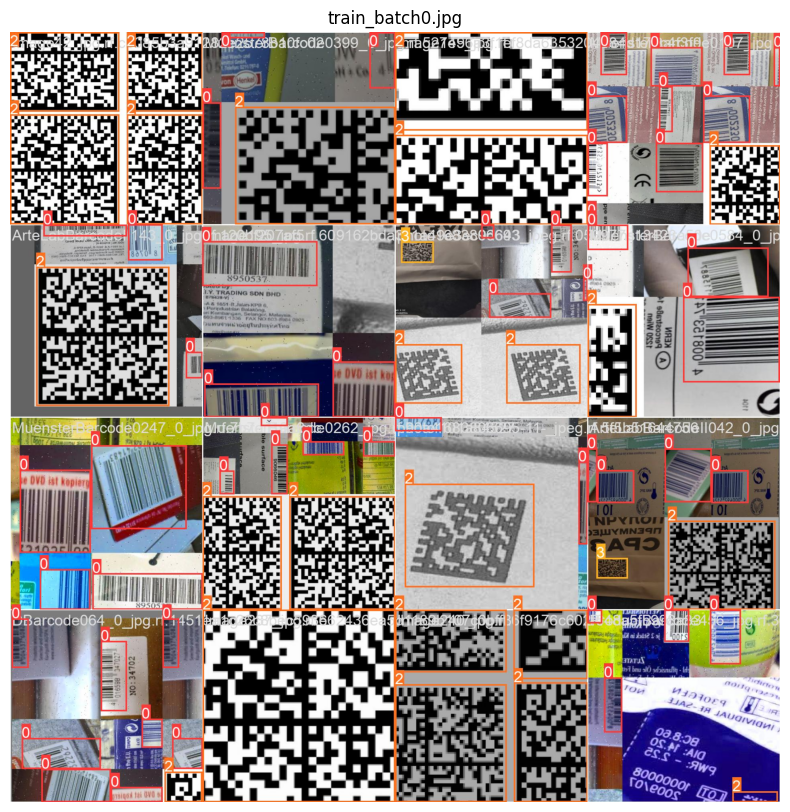

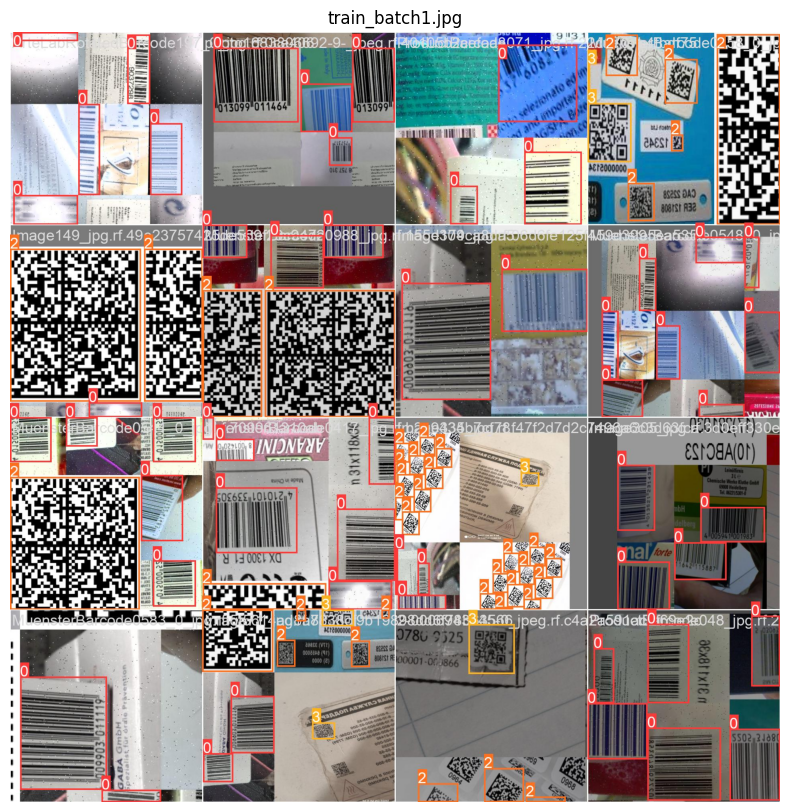

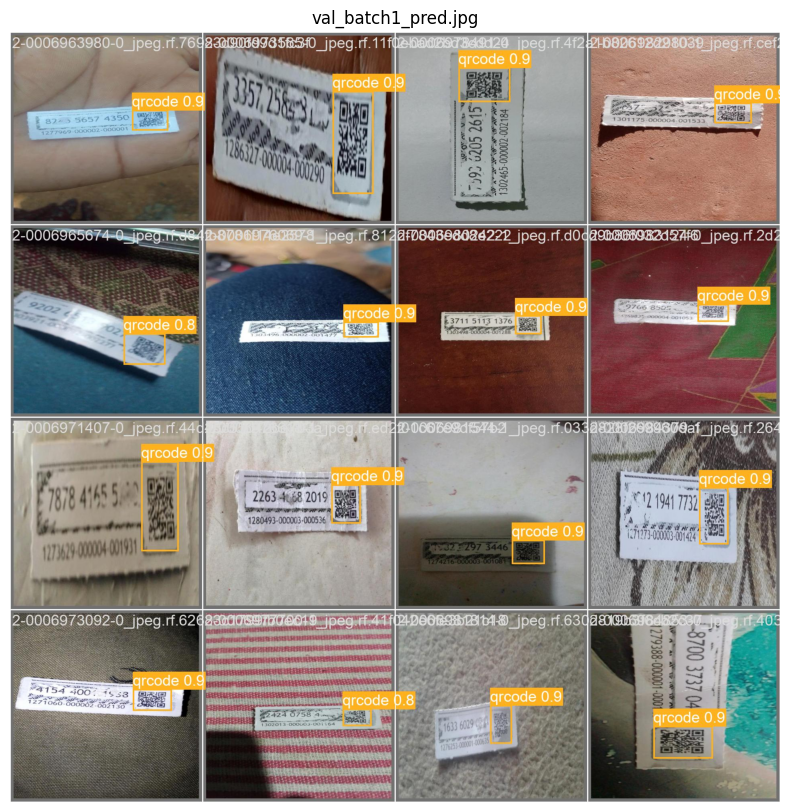

File does not exist: /kaggle/working/runs/detect/train2/val_batch2_pred.jpgresults.png


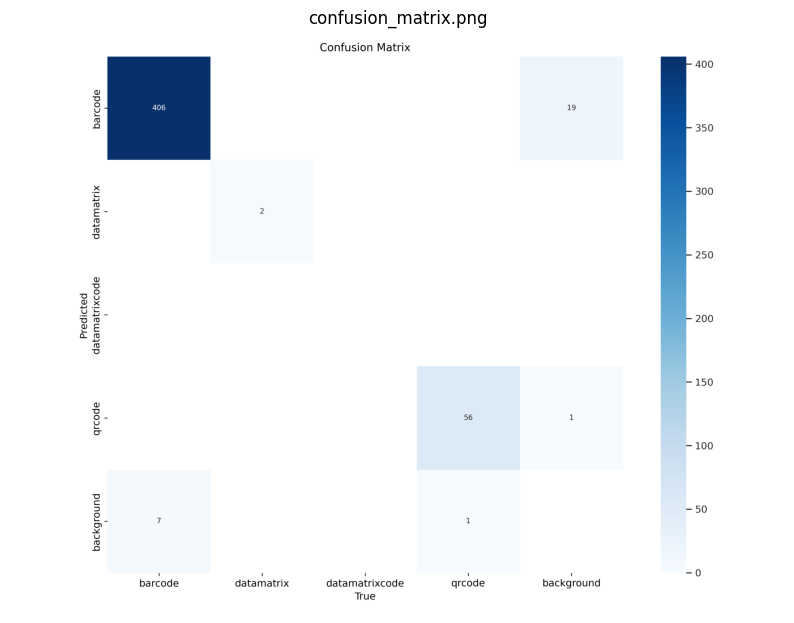

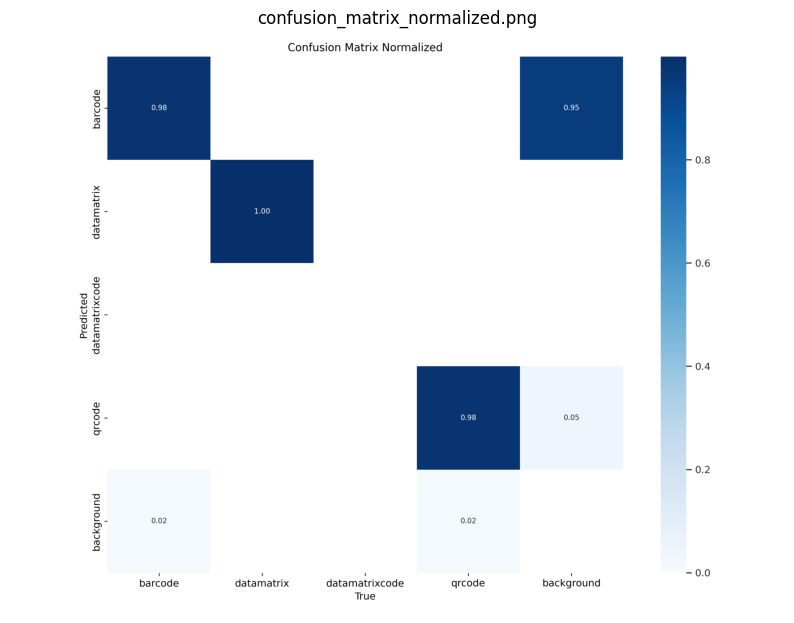

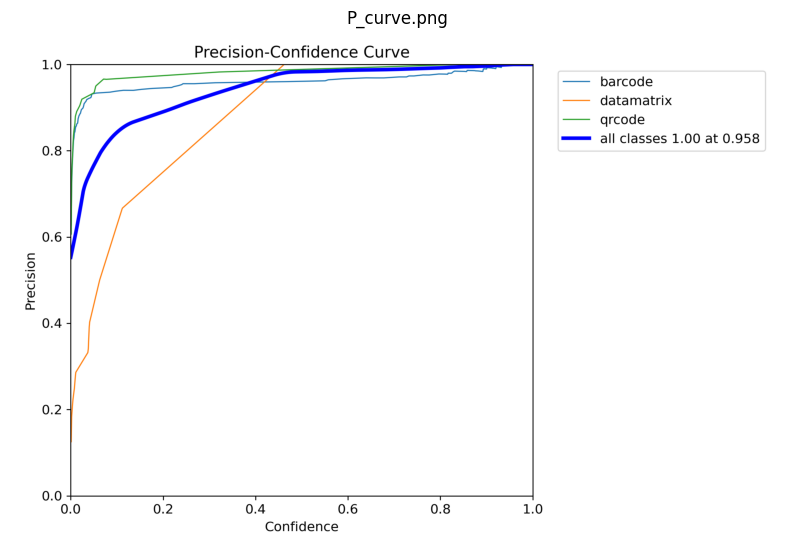

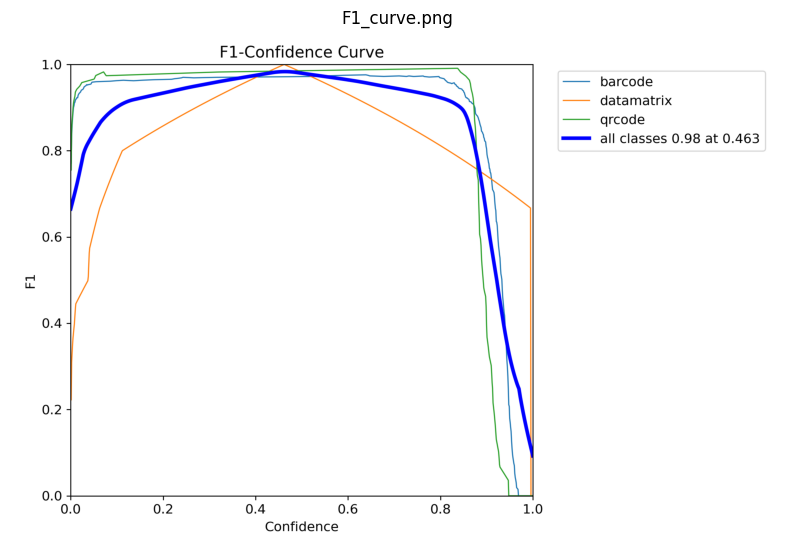

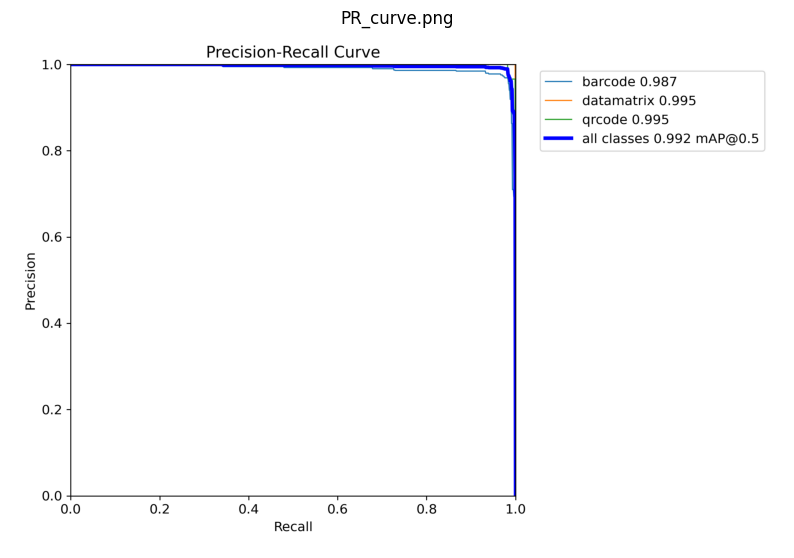

In [19]:
import cv2
import matplotlib.pyplot as plt
import os

# Directory containing the images
results_dir = '/kaggle/working/runs/detect/train2'

# List of images to visualize
image_files = [
    'train_batch0.jpg', 'train_batch1.jpg', 'val_batch1_pred.jpg','val_batch2_pred.jpg'
    'results.png', 'confusion_matrix.png','confusion_matrix_normalized.png' ,'P_curve.png', 'F1_curve.png', 'PR_curve.png'
]
image_paths = [os.path.join(results_dir, img) for img in image_files]

# Load and display each image
for img_path in image_paths:
    if os.path.exists(img_path):
        # Read the image using OpenCV
        image = cv2.imread(img_path)
        if image is None:
            print(f"Failed to load image: {img_path}")
            continue

        # Convert the image from BGR to RGB format
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display the image using Matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.title(os.path.basename(img_path))
        plt.axis('off')
        plt.show()
    else:
        print(f"File does not exist: {img_path}")

In [20]:
import pandas as pd

# Path to the results CSV file
results_csv_path = '/kaggle/working/runs/detect/train2/results.csv'

# Load the CSV file into a DataFrame
results_df = pd.read_csv(results_csv_path)

# Display the first few rows of the DataFrame to understand its structure
print(results_df.head())

# Optional: Display the column names to understand what metrics are included
print(results_df.columns)

# Optional: If you want to plot the loss or any other metric
import matplotlib.pyplot as plt

# Assuming there are 'Epoch', 'Train Loss', 'Val Loss' columns or similar
if 'Epoch' in results_df and 'Train Loss' in results_df and 'Val Loss' in results_df:
    plt.figure(figsize=(12, 6))
    plt.plot(results_df['Epoch'], results_df['Train Loss'], label='Train Loss')
    plt.plot(results_df['Epoch'], results_df['Val Loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss over Epochs')
    plt.legend()
    plt.show()


                  epoch        train/box_loss        train/cls_loss  \
0                     1               1.07610               1.45920   
1                     2               1.06350               0.98019   
2                     3               1.08480               0.95059   
3                     4               1.04390               0.84560   
4                     5               0.97721               0.80577   

         train/dfl_loss  metrics/precision(B)     metrics/recall(B)  \
0                1.3301               0.81758               0.51984   
1                1.3229               0.80811               0.52796   
2                1.3077               0.74357               0.87329   
3                1.2772               0.76989               0.91828   
4                1.2354               0.86794               0.53988   

       metrics/mAP50(B)   metrics/mAP50-95(B)          val/box_loss  \
0               0.76431               0.49114                1.1089   
1   

# test images

In [43]:
# Run batched inference on a list of images
results = model(["/kaggle/working/Barcode-Detection--2/test/images/Image125_jpg.rf.ba53c9c97494ce702f21f487627daf06.jpg", "/kaggle/working/Barcode-Detection--2/test/images/Image259_jpg.rf.008445292dac84609c31f301d8f1b041.jpg"])  # return a list of Results objects



0: 800x800 3 barcodes, 1 datamatrixcode, 1 qrcode, 1457.5ms
1: 800x800 3 barcodes, 2 datamatrixcodes, 1 qrcode, 1457.5ms
Speed: 6.3ms preprocess, 1457.5ms inference, 0.8ms postprocess per image at shape (1, 3, 800, 800)


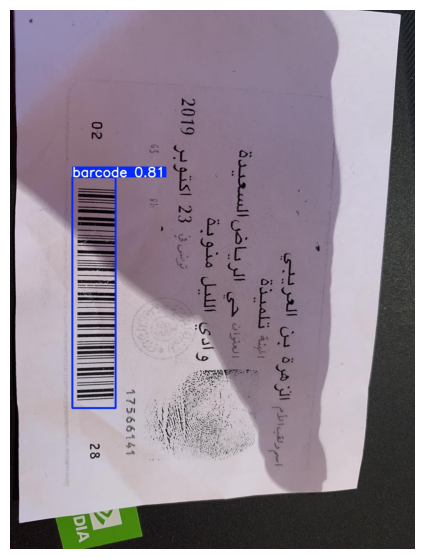

In [14]:
import torch
from matplotlib import pyplot as plt
from PIL import Image
import os

# Directory to save results
save_dir = '/kaggle/working/results'
os.makedirs(save_dir, exist_ok=True)


# Process and visualize each result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(7, 7))
    plt.imshow(img)
    plt.axis('off')
    plt.show()



0: 800x800 3 barcodes, 1 datamatrixcode, 1 qrcode, 2053.8ms
1: 800x800 3 barcodes, 2 datamatrixcodes, 1 qrcode, 2053.8ms
2: 800x800 1 qrcode, 2053.8ms
3: 800x800 1 datamatrixcode, 2053.8ms
4: 800x800 1 datamatrixcode, 2053.8ms
5: 800x800 10 datamatrixcodes, 2053.8ms
6: 800x800 1 datamatrixcode, 2053.8ms
7: 800x800 1 qrcode, 2053.8ms
8: 800x800 (no detections), 2053.8ms
9: 800x800 2 datamatrixcodes, 2053.8ms
10: 800x800 1 datamatrixcode, 2053.8ms
11: 800x800 1 datamatrixcode, 2053.8ms
12: 800x800 2 datamatrixcodes, 2053.8ms
13: 800x800 1 datamatrixcode, 2053.8ms
14: 800x800 1 datamatrixcode, 2053.8ms
15: 800x800 1 datamatrixcode, 2053.8ms
16: 800x800 5 datamatrixcodes, 2053.8ms
17: 800x800 1 qrcode, 2053.8ms
18: 800x800 1 datamatrixcode, 2053.8ms
19: 800x800 1 barcode, 1 datamatrixcode, 2053.8ms
20: 800x800 1 qrcode, 2053.8ms
21: 800x800 4 barcodes, 1 datamatrixcode, 1 qrcode, 2053.8ms
22: 800x800 1 datamatrixcode, 2053.8ms
23: 800x800 1 datamatrixcode, 2053.8ms
24: 800x800 1 datamatri

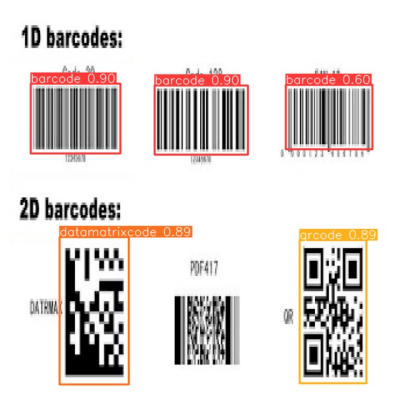

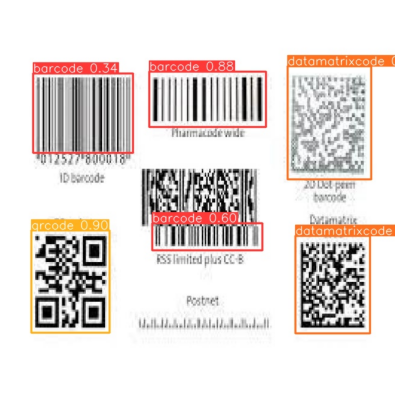

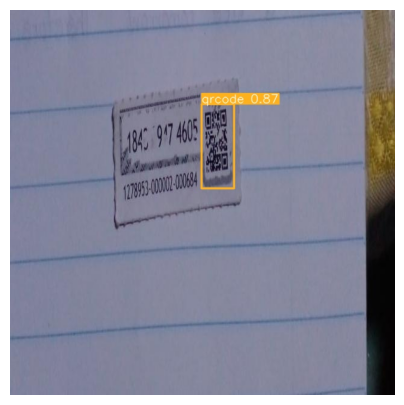

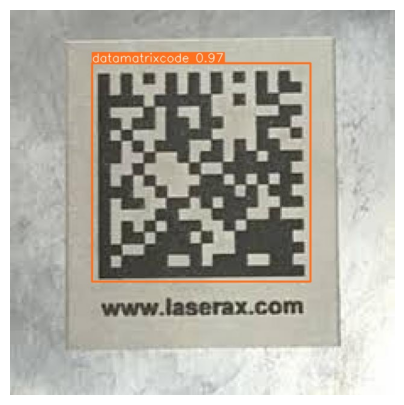

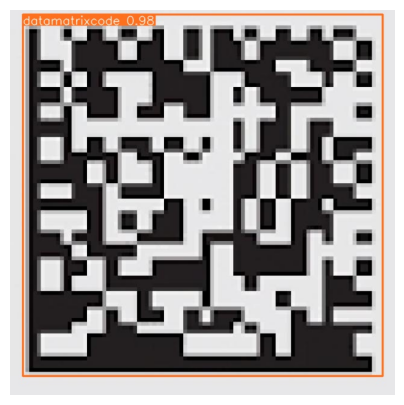

...

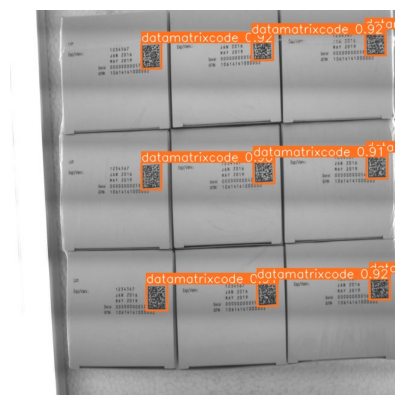

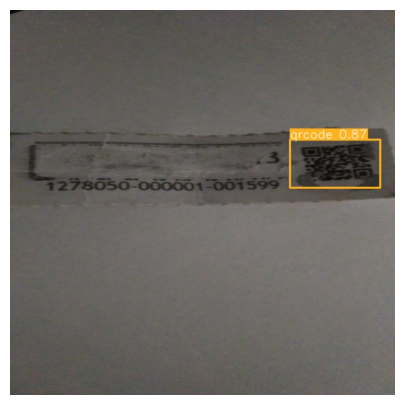

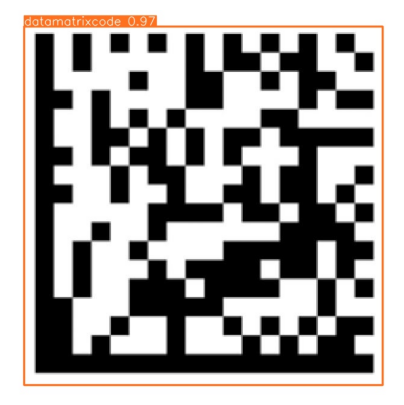

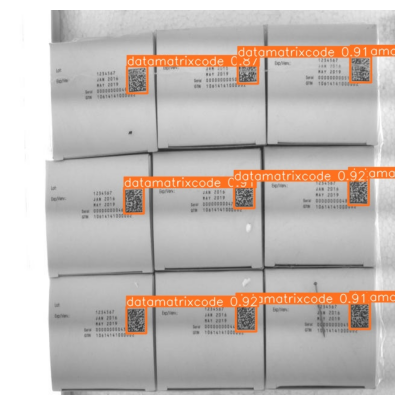

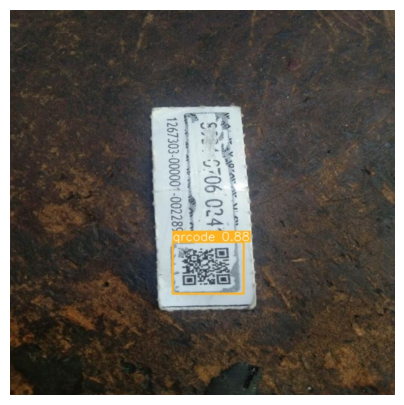

In [50]:
# Directory containing test images
test_images_dir = '/kaggle/working/Barcode-Detection--2/test/images'
os.makedirs(save_dir, exist_ok=True)

# List of test image filenames
image_filenames = [f for f in os.listdir(test_images_dir) if f.endswith('.jpg') or f.endswith('.png')]

# Run batched inference on the test images
results = model([os.path.join(test_images_dir, filename) for filename in image_filenames])

# Process and visualize each result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image 1/1 /kaggle/input/testtt/441963980_1139719600642915_3228926578479520021_n.jpg: 800x608 1 barcode, 1008.2ms
Speed: 4.6ms preprocess, 1008.2ms inference, 1.0ms postprocess per image at shape (1, 3, 800, 608)


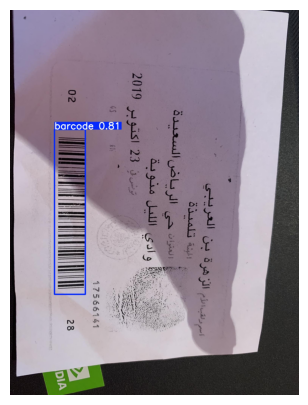

In [15]:
# Path to the test image
test_image_path = '/kaggle/input/testtt/441963980_1139719600642915_3228926578479520021_n.jpg'
os.makedirs(save_dir, exist_ok=True)

# Run inference on the test image
results = model(test_image_path)

# Save and display the result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image 1/1 /kaggle/input/testtt/448081138_1668018324027031_4364105906501871164_n.jpg: 800x608 1 barcode, 980.8ms
Speed: 5.2ms preprocess, 980.8ms inference, 0.9ms postprocess per image at shape (1, 3, 800, 608)


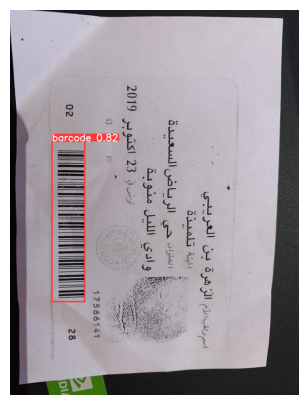

In [52]:
# Path to the test image
test_image_path = '/kaggle/input/testtt/448081138_1668018324027031_4364105906501871164_n.jpg'
os.makedirs(save_dir, exist_ok=True)

# Run inference on the test image
results = model(test_image_path)

# Save and display the result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image 1/1 /kaggle/input/testtt1/6e4c0c00-388c-4052-a038-b65bb911e352.jpeg: 800x608 2 barcodes, 983.3ms
Speed: 5.0ms preprocess, 983.3ms inference, 1.2ms postprocess per image at shape (1, 3, 800, 608)


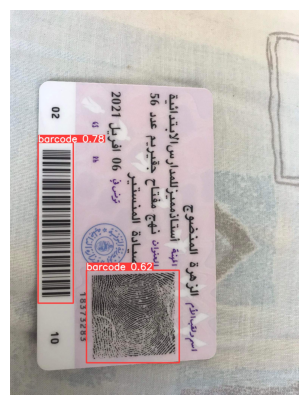

In [67]:
# Path to the test image
test_image_path = '/kaggle/input/testtt1/6e4c0c00-388c-4052-a038-b65bb911e352.jpeg'
os.makedirs(save_dir, exist_ok=True)

# Run inference on the test image
results = model(test_image_path)

# Save and display the result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image 1/1 /kaggle/input/testtt1/761dce79-1b4b-4358-b4d5-83c2c1928e25.jpeg: 800x608 1 barcode, 948.6ms
Speed: 4.5ms preprocess, 948.6ms inference, 0.8ms postprocess per image at shape (1, 3, 800, 608)


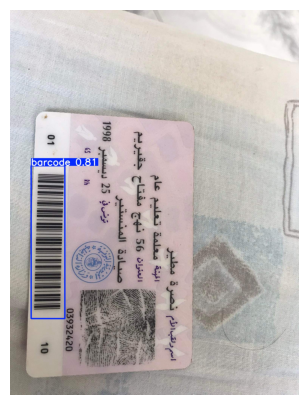

In [16]:
# Path to the test image
test_image_path = '/kaggle/input/testtt1/761dce79-1b4b-4358-b4d5-83c2c1928e25.jpeg'
os.makedirs(save_dir, exist_ok=True)

# Run inference on the test image
results = model(test_image_path)

# Save and display the result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image 1/1 /kaggle/input/testtt3/CIN1.jpg: 480x800 1 barcode, 1 qrcode, 751.9ms
Speed: 2.7ms preprocess, 751.9ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 800)


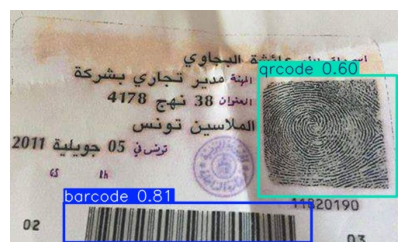

In [17]:
# Path to the test image
test_image_path = '/kaggle/input/testtt3/CIN1.jpg'
os.makedirs(save_dir, exist_ok=True)

# Run inference on the test image
results = model(test_image_path)

# Save and display the result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image 1/1 /kaggle/input/testtt3/recto.png: 544x800 1 barcode, 1 qrcode, 831.2ms
Speed: 2.9ms preprocess, 831.2ms inference, 0.8ms postprocess per image at shape (1, 3, 544, 800)


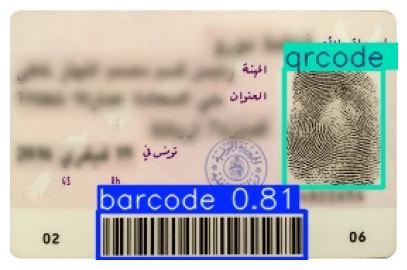

In [18]:
# Path to the test image
test_image_path = '/kaggle/input/testtt3/recto.png'
os.makedirs(save_dir, exist_ok=True)

# Run inference on the test image
results = model(test_image_path)

# Save and display the result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()


0: 800x608 1 barcode, 1101.7ms
1: 800x608 (no detections), 1101.7ms
2: 800x608 1 barcode, 1101.7ms
3: 800x608 1 barcode, 1101.7ms
Speed: 5.4ms preprocess, 1101.7ms inference, 0.5ms postprocess per image at shape (1, 3, 800, 608)


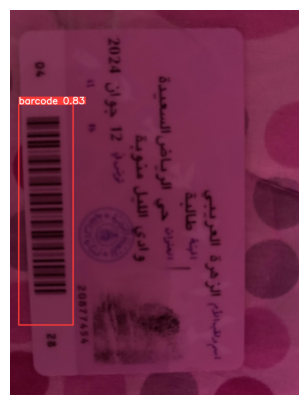

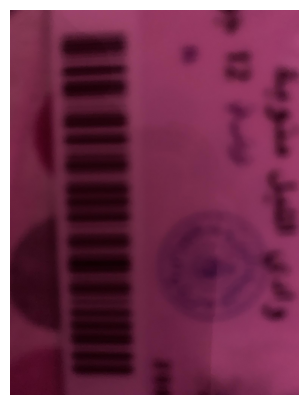

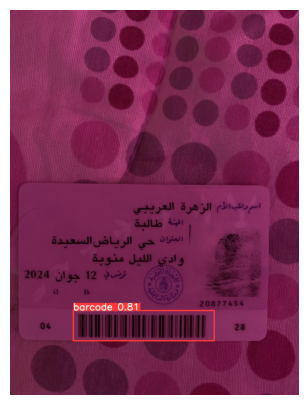

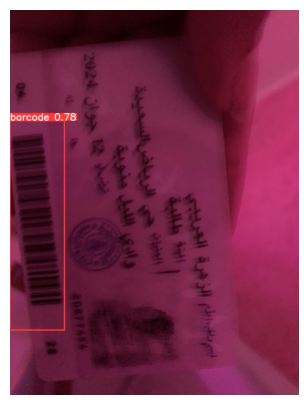

In [69]:
# Directory containing test images
test_images_dir = '/kaggle/input/testtt2'
os.makedirs(save_dir, exist_ok=True)

# List of test image filenames
image_filenames = [f for f in os.listdir(test_images_dir) if f.endswith('.jpg') or f.endswith('.png')]

# Run batched inference on the test images
results = model([os.path.join(test_images_dir, filename) for filename in image_filenames])

# Process and visualize each result
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image 1/1 /kaggle/input/testtt3/CIN1.jpg: 480x800 1 barcode, 1 qrcode, 794.1ms
Speed: 3.1ms preprocess, 794.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 800)


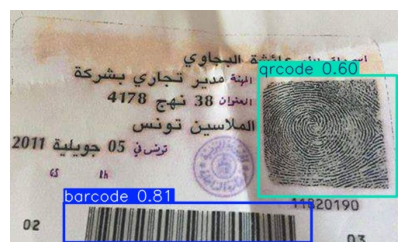

AttributeError: 'Results' object has no attribute 'xyxy'. See valid attributes below.

    A class for storing and manipulating inference results.

    Attributes:
        orig_img (numpy.ndarray): Original image as a numpy array.
        orig_shape (tuple): Original image shape in (height, width) format.
        boxes (Boxes, optional): Object containing detection bounding boxes.
        masks (Masks, optional): Object containing detection masks.
        probs (Probs, optional): Object containing class probabilities for classification tasks.
        keypoints (Keypoints, optional): Object containing detected keypoints for each object.
        speed (dict): Dictionary of preprocess, inference, and postprocess speeds (ms/image).
        names (dict): Dictionary of class names.
        path (str): Path to the image file.

    Methods:
        update(boxes=None, masks=None, probs=None, obb=None): Updates object attributes with new detection results.
        cpu(): Returns a copy of the Results object with all tensors on CPU memory.
        numpy(): Returns a copy of the Results object with all tensors as numpy arrays.
        cuda(): Returns a copy of the Results object with all tensors on GPU memory.
        to(*args, **kwargs): Returns a copy of the Results object with tensors on a specified device and dtype.
        new(): Returns a new Results object with the same image, path, and names.
        plot(...): Plots detection results on an input image, returning an annotated image.
        show(): Show annotated results to screen.
        save(filename): Save annotated results to file.
        verbose(): Returns a log string for each task, detailing detections and classifications.
        save_txt(txt_file, save_conf=False): Saves detection results to a text file.
        save_crop(save_dir, file_name=Path("im.jpg")): Saves cropped detection images.
        tojson(normalize=False): Converts detection results to JSON format.
    

In [19]:
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Function to crop and save the barcode image
def crop_and_save_barcode(image_path, results, save_dir):
    # Load the original image
    original_image = cv2.imread(image_path)
    
    # Iterate over each detected result
    for i, result in enumerate(results):
        # Get the bounding box coordinates
        for detection in result.xyxy[0].numpy():
            x_min, y_min, x_max, y_max, conf, cls = detection
            x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)
            
            # Crop the barcode from the original image
            cropped_barcode = original_image[y_min:y_max, x_min:x_max]
            
            # Save the cropped barcode image
            cropped_save_path = os.path.join(save_dir, f'cropped_barcode_{i}.jpg')
            cv2.imwrite(cropped_save_path, cropped_barcode)
            
            # Display the cropped barcode image using matplotlib
            cropped_img = Image.open(cropped_save_path)
            plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
            plt.imshow(cropped_img)
            plt.axis('off')
            plt.show()

# Path to the test image
test_image_path = '/kaggle/input/testtt3/CIN1.jpg'
save_dir = '/kaggle/working/saved_results'
os.makedirs(save_dir, exist_ok=True)

# Assuming `model` is already defined and loaded
# Run inference on the test image
results = model(test_image_path)

# Save and display the result with bounding boxes
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Crop and save the barcode image(s)
crop_and_save_barcode(test_image_path, results, save_dir)



image 1/1 /kaggle/input/testtt3/CIN1.jpg: 480x800 1 barcode, 1 qrcode, 777.3ms
Speed: 3.2ms preprocess, 777.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 800)


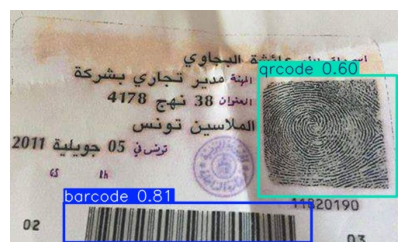

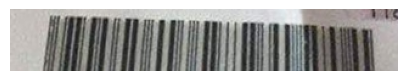

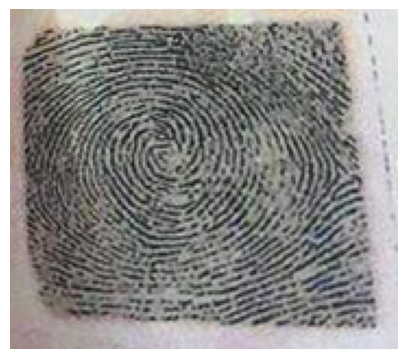

In [20]:
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Function to crop and save the barcode image
def crop_and_save_barcode(image_path, results, save_dir):
    # Load the original image
    original_image = cv2.imread(image_path)
    
    # Iterate over each detected result
    for i, result in enumerate(results):
        # Get the bounding box coordinates
        for bbox in result.boxes.data:
            x_min, y_min, x_max, y_max = map(int, bbox[:4])
            
            # Crop the barcode from the original image
            cropped_barcode = original_image[y_min:y_max, x_min:x_max]
            
            # Save the cropped barcode image
            cropped_save_path = os.path.join(save_dir, f'cropped_barcode_{i}.jpg')
            cv2.imwrite(cropped_save_path, cropped_barcode)
            
            # Display the cropped barcode image using matplotlib
            cropped_img = Image.open(cropped_save_path)
            plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
            plt.imshow(cropped_img)
            plt.axis('off')
            plt.show()

# Path to the test image
test_image_path = '/kaggle/input/testtt3/CIN1.jpg'
save_dir = '/kaggle/working/saved_results'
os.makedirs(save_dir, exist_ok=True)

# Assuming `model` is already defined and loaded
# Run inference on the test image
results = model(test_image_path)

# Save and display the result with bounding boxes
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Crop and save the barcode image(s)
crop_and_save_barcode(test_image_path, results, save_dir)


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Function to crop and save the barcode image
def crop_and_save_barcode(image_path, results, save_dir, barcode_class_id):
    # Load the original image
    original_image = cv2.imread(image_path)
    
    # Iterate over each detected result
    for i, result in enumerate(results):
        # Get the bounding box coordinates and class labels
        for bbox in result.boxes.data:
            x_min, y_min, x_max, y_max, confidence, cls_id = bbox.tolist()
            if int(cls_id) == barcode_class_id:
                x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
                
                # Crop the barcode from the original image
                cropped_barcode = original_image[y_min:y_max, x_min:x_max]
                
                # Save the cropped barcode image
                cropped_save_path = os.path.join(save_dir, f'cropped_barcode_{i}.jpg')
                cv2.imwrite(cropped_save_path, cropped_barcode)
                
                # Display the cropped barcode image using matplotlib
                cropped_img = Image.open(cropped_save_path)
                plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
                plt.imshow(cropped_img)
                plt.axis('off')
                plt.show()

# Path to the test image
test_image_path = '/kaggle/input/testtt3/CIN1.jpg'
save_dir = '/kaggle/working/saved_results'
os.makedirs(save_dir, exist_ok=True)

# Assuming `model` is already defined and loaded
# Run inference on the test image
results = model(test_image_path)

# Save and display the result with bounding boxes
for i, result in enumerate(results):
    # Save the image with bounding boxes
    save_path = os.path.join(save_dir, f'result_{i}.jpg')
    result.plot(save=True, filename=save_path)  # Save the plotted image

    # Display the saved image using matplotlib
    img = Image.open(save_path)
    plt.figure(figsize=(5, 5))  # Adjust the size of the figure as needed
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Class ID for barcodes (assuming you know the class ID for barcodes)
barcode_class_id = 0  # Replace this with the actual class ID for barcodes

# Crop and save the barcode image(s)
crop_and_save_barcode(test_image_path, results, save_dir, barcode_class_id)
